# The Bayesian Statistics Toolbox (BST): *Building a robust, replicable Bayesian workflow for the behavioral and neural sciences*
---

<div class="alert alert-block alert-info">
    <b>Note:</b> This notebook was adapted from the Google Colab notebook used in Hyosub's talk for 
<a href="https://discourse.pymc.io/t/pymcon-web-series-05-the-bayesian-statistics-toolbox-april-17th-2023-hyosub-kim/11845">PyMCon 2023</a>.
</div>

## <center>Welcome, and thanks for attending my talk!</center>


<figure>
<center><img src="https://raw.githubusercontent.com/hyosubkim/pymcon-data/main/images/hyosub_headshot.png" width=200></center>
    <center><figcaption><i>In front of living wall in Philadelphia</i></figcaption></center>
</figure>


## A bit about myself

- Currently, Assistant Professor at University of Delaware (Depts. of Physical Therapy and Psychological & Brain Sciences) where I direct the [Sensorimotor Learning Lab](https://osf.io/y75ud/wiki/home/)
    - Starting as Assistant Professor at University of British Columbia (School of Kinesiology) in July 2023
- Our research combines computational modeling, behavioral experiments, and neurologic patient testing to better understand fundamental principles of human motor learning and motor control 
- Have strong interest in how we make inferences and recently started migrating from classical (frequentist) to primarily Bayesian statistics

- Email: hyosubkim1@gmail.com, hyosub.kim@ubc.ca
- Twitter: https://twitter.com/HyosubEKim


## Acknowledgments

Thank you to the following people for generously sharing their work and knowledge:

- [PyMC developers](https://github.com/pymc-devs/pymc)
- [ArviZ developers](https://www.arviz.org/en/latest/our_team.html)
- [Jordi Warmenhoven](https://github.com/JWarmenhoven)
- [John Kruschke](https://jkkweb.sitehost.iu.edu/)
- [Richard McElreath](https://xcelab.net/rm/)

Special thanks to PyMCon organizers, especially: 
- [Rowan Schaefer](https://rowanschaefer.cargo.site/), [Austin Rochford](https://austinrochford.com/), and [Ravin Kumar](https://ravinkumar.com/)


## Roadmap 

- *First off, if you have questions and/or want to discuss anything you've heard today, go to: www.cutt.ly/BST-discussion* 

- Introduce the BST
- Preliminaries to get set-up with BST
- Introduce the behavioral data we'll be working with
- Go through some worked examples of using BST together:
    - Example 1: Comparison of two groups
    - Example 2: Repeated measures design
    - Example 3: Mixed-model design with within- and between-subjects factors
- Concluding thoughts


## Goals for this talk 

- Introduce the Bayesian Statistics Toolbox (BST) and its rationale
- Demonstrate sensible Bayesian workflow with BST, PyMC, and other modules (e.g., Arviz)
- Discuss some pedagogical uses for BST
- **Overall goal is that you will walk away from this talk feeling like you are more likely to use Bayesian statistics in your own work**

## Target audience

Anyone who matches any of these descriptions: 

- Students, people in industry, and academics who are familiar with frequentist statistics but want to learn and do more with Bayesian statistics 
- Those who have a good grasp of Bayesian fundamentals but still rely on frequentist tests because start-up cost to switch is too high
- Those who are just starting to learn Bayesian statistics and PyMC and want some extra help to get them going


## What this talk is *not* about

- Teaching Bayesian inference from the ground up
    - Excellent textbooks for that by [John Kruschke](https://jkkweb.sitehost.iu.edu/DoingBayesianDataAnalysis/) and [Richard McElreath](https://xcelab.net/rm/statistical-rethinking/)
- Explicitly trying to convince you of the benefits of Bayesian statistics
    - Assuming you're watching a PyMCon talk because you're already interested in Bayes
    - There will still be some comparisons of frequentist vs Bayesian stats

## What is the [Bayesian Statistics Toolbox (BST)](https://github.com/hyosubkim/bayesian-statistics-toolbox)?

<center><img src="https://raw.githubusercontent.com/hyosubkim/pymcon-data/main/images/bst_screenshot.png"></center>

- A library of functions that take advantage of Python/PyMC for running a spectrum of Bayesian analyses in a simple, straight forward manner
- Functions are *primarily* wrappers for Bayesian generalized linear models (GLMs)
- Module that allows you to run Bayesian analogues of most commonly used frequentist tests (t-tests, ANOVAs, regressions), typically with one-liners
- Model scaffolding for your own Bayesian explorations
- Also makes Bayesian modeling more user-friendly by including helper functions for:
    - Standardizing/unstandardizing variables for more efficient MCMC sampling
    - Parsing categorical variables for easier indexing
    - Implementing sum-to-zero constraints in ANOVA-like models
- Full installation instructions on [GitHub](https://github.com/hyosubkim/bayesian-statistics-toolbox)


### Options for today 
- You can copy this Colab notebook into your Google Drive
- Other alternative to install BST locally:
``` 
pip install git+https://github.com/hyosubkim/bayesian-statistics-toolbox#egg=src
import src as bst 
```


### Dependencies:

- [ArviZ](https://arviz-devs.github.io/arviz/)
- [NumPy](https://numpy.org/)
- [pandas](https://pandas.pydata.org/)
- [PyMC](https://www.pymc.io/welcome.html)
- [seaborn](https://seaborn.pydata.org/)
- [Xarray](https://docs.xarray.dev/en/stable/)

## Why BST?

Personal motivations: 
- Wanted to have a sustainable, ongoing project that turned what I was learning about Bayesian statistics into something useful for my future self and future lab members
    - Originally started working through Kruschke textbook with help of [Jordi Warmenhoven's Python/PyMC3 notebooks](https://github.com/JWarmenhoven/DBDA-python) because I wanted to do everything in Python
    - By wrapping models inside functions, knew that I would be more likely to use them
- Later realization that there are probably lots of others like me for whom this may be helpful

Broader motivations: 
- Help lower the bar for entry into using Bayesian statistics, especially for behavioral (i.e., psychologists, kinesiologists, clinicians, etc.) and neuroscience researchers
- Serve as a bridge between coding things up from scratch to the super flexible modeling you can do with [Bambi](https://bambinos.github.io/bambi/index.html)
    - BST should be especially helpful for Python users learning Bayes with the Kruschke textbook 
- Make it less tempting to fall back into frequentist habits and using one-liners with `statsmodels`:


```python
# BEST test in raw PyMC
mu_y = y.mean()
sigma_y = y.std()
                                                                     
with pm.Model() as model:
    # Define priors.  
    group_mean = pm.Normal("group_mean", mu=mu_y, sigma=sigma_y * 2, shape=len(level))
    group_std = pm.Uniform("group_std", lower=sigma_y / 10, upper=sigma_y * 10, shape=len(level))
    nu_minus_one = pm.Exponential("nu_minus_one", 1 / 29)
    nu = pm.Deterministic("nu", nu_minus_one + 1)
    nu_log10 = pm.Deterministic("nu_log10", np.log10(nu))

    # Define likelihood
    likelihood = pm.StudentT("likelihood", nu=nu, mu=group_mean[group_idx], sigma=group_std[group_idx], observed=y)

    # Contrasts of interest
    diff_of_means = pm.Deterministic("difference of means", group_mean[0] - group_mean[1])
    diff_of_stds = pm.Deterministic("difference of stds", group_std[0] - group_std[1])
    effect_size = pm.Deterministic(
        "effect size", diff_of_means / np.sqrt((group_std[0]**2 + group_std[1]**2) / 2)
    )

    # Sample from posterior
    idata = pm.sample(draws=n_draws)
```

<center><b>VERSUS</b></center>

```python
# t-test from statsmodels
stats.ttest_ind(x1, x2)
```

<center><b>VERSUS</b></center>

```python
# BST version
model, idata = BEST(df.y, df.group)
```

## Import libraries

In [1]:
import arviz as az
import numpy as np
import numpy.ma as ma
import pandas as pd
import pymc as pm
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import norm
import seaborn as sns


In [2]:
%config InlineBackend.figure_format = 'retina'
az.style.use("arviz-darkgrid")
az.rcParams["stats.hdi_prob"] = 0.95
rng = np.random.default_rng(seed=42)

color = '#87ceeb'

In [3]:
# Clone repo to grab data -- this will add entire pymcon-data directory
!git clone https://github.com/hyosubkim/pymcon-data

fatal: destination path 'pymcon-data' already exists and is not an empty directory.


In [4]:
#@title BST and other functions     

def standardize(X):
    """Standardize the input variable.
    
    Args:
        X (ndarray): The variable(s) to standardize. 
    
    Returns:
        ndarray
    """
    
    # Check if X is a dataframe, in which case it will be handled differently. 
    if isinstance(X, pd.DataFrame):
        mu_X = X.mean().values
        sigma_X = X.std().values
        X_s = ((X - mu_X) / sigma_X)
        return X_s, mu_X, sigma_X
    else:
        X_s = (X - X.mean()) / X.std()
        return X_s, X.mean(), X.std()


def parse_categorical(x):
    """A function for extracting information from a grouping variable.
    
    If the input arg is not already a category-type variable, converts 
    it to one. Then, extracts the codes, unique levels, and number of 
    levels from the variable.
    
    Args:
        x (categorical): The categorical type variable to parse.
    
    Returns:
        The codes, unique levels, and number of levels from the input variable. 
    """
    
    # First, check to see if passed variable is of type "category".
    if pd.api.types.is_categorical_dtype(x):
        pass
    else:
        x = x.astype('category')
    categorical_values = x.cat.codes.values
    levels = x.cat.categories
    n_levels = len(levels)

    return categorical_values, levels, n_levels


def is_standardized(X, eps=0.0001):
    """Checks to see if variable is standardized (i.e., N(0, 1)).
    
    Args: 
        x: Random variable.
        eps: Some small value to represent tolerance level.
    
    Returns:
        Bool
    """
    
    if isinstance(X, pd.DataFrame):
        mu_X = X.mean().values
        sigma_X = X.std().values
        X_s = ((X - mu_X) / sigma_X)
        return np.equal((mu_X**2 < eps).sum() + ((sigma_X - 1)**2 < eps).sum(),
                        len(mu_X) + len(sigma_X))
    else:
        return (X.mean()**2 < eps) & ((X.std() - 1)**2 < eps)

    
def gamma_shape_rate_from_mode_sd(mode, sd):
    """Calculate Gamma shape and rate parameters from mode and sd.
    
    """
    rate = (mode + np.sqrt(mode**2 + 4 * sd**2 )) / (2 * sd**2)
    shape = 1 + mode * rate
    
    return shape, rate


# This function comes from Jordi Warmenhoven's DBDA repo
def plot_mustache(var, sd, j, width=.75, ax=None):
    for i in np.arange(0, len(var), int(len(var)*.1)):
        rv = norm(loc=var[i], scale=sd[i])
        yrange = np.linspace(rv.ppf(0.01), rv.ppf(0.99), 100)
        xrange = rv.pdf(yrange)
        
        # When the SD of a group is large compared to others, then the top of its mustache is relatively
        # low and does not plot well together with low SD groups.
        # Scale the xrange so that the 'height' of the all mustaches is 0.75
        xrange_scaled = xrange*(width/xrange.max())
        
        # Using the negative value to flip the mustache in the right direction.
        ax.plot(-xrange_scaled+j, yrange, color=color, alpha=.6, zorder=99)


def BEST(y, group, n_draws=1000):
    """Implementation of John Kruschke's BEST test.
    
    Estimates parameters related to outcomes of two groups. See:
        https://jkkweb.sitehost.iu.edu/articles/Kruschke2013JEPG.pdf
        for more details. 
    
    Args:
        y (ndarray/Series): The metric outcome variable.
        group: The grouping variable providing that indexes into y.
        n_draws: Number of random samples to draw from the posterior.
    
    Returns: 
        PyMC Model and InferenceData objects.
    """
    
    # Convert grouping variable to categorical dtype if it is not already
    if pd.api.types.is_categorical_dtype(group):
        pass
    else:
        group = group.astype('category')
    group_idx = group.cat.codes.values
        
    # Extract group levels and make sure there are only two
    level = group.cat.categories
    assert len(level) == 2, f"Expected two groups but got {len(level)}."
    
    # Calculate pooled empirical mean and SD of data to scale hyperparameters
    mu_y = y.mean()
    sigma_y = y.std()
                                                                     
    with pm.Model() as model:
        # Define priors. Arbitrarily set hyperparameters to the pooled 
        # empirical mean of data and twice pooled empirical SD, which 
        # applies very diffuse and unbiased info to these quantities. 
        group_mean = pm.Normal("group_mean", mu=mu_y, sigma=sigma_y * 2, shape=len(level))
        group_std = pm.Uniform("group_std", lower=sigma_y / 10, upper=sigma_y * 10, shape=len(level))
        
        # See Kruschke Ch 16.2.1 for in-depth rationale for prior on nu. The addition of 1 is to shift the
        # distribution so that the range of possible values of nu are 1 to infinity (with mean of 30).
        nu_minus_one = pm.Exponential("nu_minus_one", 1 / 29)
        nu = pm.Deterministic("nu", nu_minus_one + 1)
        nu_log10 = pm.Deterministic("nu_log10", np.log10(nu))
        
        # Define likelihood
        likelihood = pm.StudentT("likelihood", nu=nu, mu=group_mean[group_idx], sigma=group_std[group_idx], observed=y)
        
        # Contrasts of interest
        diff_of_means = pm.Deterministic("difference of means", group_mean[0] - group_mean[1])
        diff_of_stds = pm.Deterministic("difference of stds", group_std[0] - group_std[1])
        effect_size = pm.Deterministic(
            "effect size", diff_of_means / np.sqrt((group_std[0]**2 + group_std[1]**2) / 2)
        )
        
        # Sample from posterior
        idata = pm.sample(draws=n_draws)
        
    return model, idata


def bayesian_oneway_rm_anova(x1, x_s, y, tune=2000, n_draws=1000):
    """Bayesian analogue of RM ANOVA.
    
    Models instance of outcome resulting from two categorical predictors,
    x1 and x_s (subject identifier). This model assumes each subject 
    contributes only one value to each cell. Therefore, there is no
    modeling of an interaction effect (see Kruschke Ch. 20.5).
    
    Args:
        x1: First categorical predictor variable.
        x_s: Second categorical predictor variable - subject.
        y: The outcome variable.
    
    Returns:
        PyMC Model and InferenceData objects.
    """
    mu_y = y.mean()
    sigma_y = y.std()

    a_shape, a_rate = gamma_shape_rate_from_mode_sd(sigma_y / 2 , 2 * sigma_y)
    x1_vals, levels1, n_levels1 = parse_categorical(x1)
    x_s_vals, levels_s, n_levels_s = parse_categorical(x_s)

    with pm.Model(coords={"factor1": levels1, "factor_subj": levels_s}) as model:
        # To understand the reparameterization, see:
        # http://twiecki.github.io/blog/2017/02/08/bayesian-hierchical-non-centered/ 
        a0_tilde = pm.Normal('a0_tilde', mu=0, sigma=1)
        a0 = pm.Deterministic('a0', mu_y + sigma_y * 5 * a0_tilde)

        sigma_a1 = pm.Gamma('sigma_a1', a_shape, a_rate)
        # sigma_a1 = 5
        a1_tilde = pm.Normal('a1_tilde', mu=0, sigma=1, dims="factor1")
        a1 = pm.Deterministic('a1', 0.0 + sigma_a1*a1_tilde)

        sigma_a_s = pm.Gamma('sigma_a_s', a_shape, a_rate)
        a_s_tilde = pm.Normal('a_s_tilde', mu=0, sigma=1, dims="factor_subj")
        a_s = pm.Deterministic('a_s', 0.0 + sigma_a_s * a_s_tilde)

        mu = a0 + a1[x1_vals] + a_s[x_s_vals] 
        sigma = pm.Uniform('sigma', sigma_y / 100, sigma_y * 10)
        
        # Define the likelihood function
        likelihood = pm.Normal('likelihood', mu, sigma=sigma, observed=y) 
        
        # Sample from the posterior
        idata = pm.sample(draws=n_draws, target_accept=0.95)
        
        return model, idata
    

def oneway_rm_anova_convert_to_sum_to_zero(idata, x1, x_s):
    """Returns coefficients that obey sum-to-zero constraint.
    
    Args:
        idata: InferenceData object.
        x1: First categorical predictor variable.
        x2: Second categorical predictor variable.
    
    Returns:
        Posterior in the form of InferenceData object. 
    
    """
    # Extract posterior probabilities and stack your chains
    # post = az.extract(idata.posterior)
    post = az.extract_dataset(idata.posterior)

    
    _, _, n_levels_x1 = parse_categorical(x1)
    _, _, n_levels_x_s = parse_categorical(x_s)
    
    # Add variables
    post = post.assign(m=(["factor1", "factor_subj", "sample"], np.zeros((n_levels_x1, n_levels_x_s, len(post['sample'])))))
    post = post.assign(b0=(["sample"], np.zeros(len(post["sample"]))))
    post = post.assign(b1=(["factor1", "sample"], np.zeros((n_levels_x1, len(post["sample"])))))
    post = post.assign(b_s=(["factor_subj", "sample"], np.zeros((n_levels_x_s, len(post["sample"])))))
    
    # Transforming the trace data to sum-to-zero values. First, calculate
    # predicted mean values based on different levels of predictors.
    for (j1, j2) in np.ndindex(n_levels_x1, n_levels_x_s):
            post.m[j1, j2] =  (post['a0'] +
                         post['a1'][j1, :] +
                         post['a_s'][j2, :])

    post["b0"] = post.m.mean(dim=["factor1", "factor_subj"])
    post["b1"] = post.m.mean(dim="factor_subj") - post.b0
    post["b_s"] = post.m.mean(dim="factor1") - post.b0
    
    assert np.allclose(post.b1.sum(dim=["factor1"]), 0, atol=1e-5)
    assert np.allclose(post.b_s.sum(dim=["factor_subj"]), 0, atol=1e-5)
        
    return post

    
def bayesian_mixed_model_anova(between_subj_var, within_subj_var, subj_id, y, n_samples=1000):
    """Performs Bayesian analogue of mixed model (split-plot) ANOVA.
    
    Models instance of outcome resulting from both between- and within-subjects
    factors. Outcome is measured several times from each observational unit (i.e.,
    repeated measures). 
    
    Args:
        between_subj_var: The between-subjects variable.
        withing_subj_var: The within-subjects variable.
        subj_id: The subj ID variable. 
        y: The outcome variable. 
    
    Returns: 
        PyMC Model and InferenceData objects. 
    """
    # Statistical model: Split-plot design after Kruschke Ch. 20
    # Between-subjects factor (i.e., group)
    x_between, levels_x_between, num_levels_x_between = parse_categorical(between_subj_var)
  
    # Within-subjects factor (i.e., target set)
    x_within, levels_x_within, num_levels_x_within = parse_categorical(within_subj_var)

    # Individual subjects
    x_subj, levels_x_subj, num_levels_x_subj = parse_categorical(subj_id)

    # Dependent variable 
    mu_y = y.mean()
    sigma_y = y.std()

    a_shape, a_rate = gamma_shape_rate_from_mode_sd(sigma_y / 2 , 2 * sigma_y)

    with pm.Model(coords={
        "between_subj": levels_x_between, 
        "within_subj": levels_x_within,
        "subj": levels_x_subj}
        ) as model:

        # Baseline value
        a0 = pm.Normal('a0', mu=mu_y, sigma=sigma_y * 5)

        # Deflection from baseline for between subjects factor
        sigma_B = pm.Gamma('sigma_B', a_shape, a_rate)
        aB = pm.Normal('aB', mu=0.0, sigma=sigma_B, dims="between_subj")

        # Deflection from baseline for within subjects factor
        sigma_W = pm.Gamma('sigma_W', a_shape, a_rate)
        aW = pm.Normal('aW', mu=0.0, sigma=sigma_W, dims="within_subj")

        # Deflection from baseline for combination of between and within subjects factors
        sigma_BxW = pm.Gamma('sigma_BxW', a_shape, a_rate)
        aBxW = pm.Normal('aBxW', mu=0.0, sigma=sigma_BxW, dims=("between_subj", "within_subj"))

        # Deflection from baseline for individual subjects
        sigma_S = pm.Gamma('sigma_S', a_shape, a_rate)
        aS = pm.Normal('aS', mu=0.0, sigma=sigma_S, dims="subj")

        mu = a0 + aB[x_between] + aW[x_within] + aBxW[x_between, x_within] + aS[x_subj] 
        sigma = pm.Uniform('sigma', lower=sigma_y / 100, upper=sigma_y * 10)
        
        # Define likelihood
        likelihood = pm.Normal('likelihood', mu=mu, sigma=sigma, observed=y)
        
        # Sample from the posterior
        idata = pm.sample(draws=n_samples, tune=2000, target_accept=.95)
    
    return model, idata


def unpack_posterior_vars(posterior):
    """Unpacks posterior variables from xarray structure.
    
    Intended for use with bayesian_mixed_model_anova.
    
    Args: 
        posterior: Posterior variables from InferenceData object.
    
    Returns: 
        Posterior variables.
    """
    a0 = posterior["a0"]
    aB = posterior['aB']
    aW = posterior['aW']
    aBxW = posterior['aBxW']
    aS = posterior['aS']
    sigma = posterior['sigma']
    
    return a0, aB, aW, aBxW, aS, sigma
    

def create_masked_array(a0, aB, aW, aBxW, aS, posterior, between_subj_var, within_subj_var, subj_id):
    """Creates a masked array with all cell values from the posterior.
    """
    # Between-subjects factor 
    x_between, levels_x_between, num_levels_x_between = parse_categorical(between_subj_var)

    # Within-subjects factor 
    x_within, levels_x_within, num_levels_x_within = parse_categorical(within_subj_var)

    # Individual subjects
    x_subj, levels_x_subj, num_levels_x_subj = parse_categorical(subj_id)
    
    # Initialize the array with zeros
    posterior = posterior.assign(m_SxBxW=(["subj", "between_subj", "within_subj", "sample"], 
                                      np.zeros((num_levels_x_subj, num_levels_x_between,
                                      num_levels_x_within, len(posterior["sample"])))))

    # Fill the arrray
    for k, i, j in zip(x_subj, x_between, x_within):
        posterior.m_SxBxW[k, i, j, :] = a0 + aB[i, :] + aW[j, :] + aBxW[i, j, :] + aS[k, :]

    # Convert to masked array that masks value '0'.
    posterior = posterior.assign(m_SxBxW=(["subj", "between_subj", "within_subj", "sample"], 
                              (ma.masked_equal(posterior.m_SxBxW, 0))))
    
    m_SxBxW = posterior.m_SxBxW

    return m_SxBxW


def calc_marginal_means(m_SxBxW):
    """Calculate the marginalized means using the masked array.
    """
    
    # Mean for subject S across levels of W, within the level of B
    m_S = m_SxBxW.mean(dim="within_subj")
    
    # Mean for treatment combination BxW, across subjects S
    m_BxW = m_SxBxW.mean(dim="subj")

    # Mean for level B, across W and S
    m_B = m_BxW.mean(dim=["within_subj"])

    # Mean for level W, across B and S
    m_W = m_BxW.mean(dim=["between_subj"])

    return m_S, m_BxW, m_B, m_W


def convert_to_sum_to_zero(idata, between_subj_var, within_subj_var, subj_id):
    """Returns coefficients that obey sum-to-zero constraing.
    
    Args:
        idata: InferenceData object.
        between_subj_var: Between-subjects predictor variable.
        within_subj_var: Within-subjects predictor variable.
        subj_id: Subject ID variable. 
    
    Returns:
        Posterior variables. 
    """
    
    posterior = az.extract_dataset(idata.posterior)
    a0, aB, aW, aBxW, aS, sigma = unpack_posterior_vars(posterior)
    m_SxBxW = create_masked_array(a0, aB, aW, aBxW, aS, posterior, between_subj_var, within_subj_var, subj_id)
    m_S, m_BxW, m_B, m_W = calc_marginal_means(m_SxBxW)
     
    # Equation 20.3
    m = m_BxW.mean(dim=["between_subj", "within_subj"])
    posterior = posterior.assign(b0 = m)

    # Equation 20.4
    posterior = posterior.assign(bB = m_B - m)

    # Equation 20.5
    posterior = posterior.assign(bW = m_W - m)

    # Equation 20.6
    posterior = posterior.assign(bBxW = m_BxW - m_B - m_W + m)

    # Equation 20.7 (removing between_subj dimension)
    posterior = posterior.assign(bS=(["subj", "sample"], (m_S - m_B).mean(dim="between_subj").data))
    
    return posterior


## About the data

- Comes from behavioral experiment involving 10 participants with Parkinson's disease (PD), a neurodegenerative disease that affects motor and cognitive function, and 10 age-matched neurotypical control participants
- **Research question:** How does PD impact motor planning?
- Task: 
    - Participants instructed to make fast, accurate reaches to different targets while sliding a stylus along a graphics tablet
    - No visual feedback of hand position until end of reach
    
<center><img src="https://raw.githubusercontent.com/hyosubkim/pymcon-data/main/images/tablet_setup.png" width=300></center>
<center><figcaption><i>Task set-up.</i></figcaption></center>

## Some Background and Theory
- Motor system independently plans movement extent (how far to move) versus movement direction (see [Gordon et al 1994](http://www.ghez.org/Gordon+PlanarI_Inertia.1994.pdf))
- PD causes many different motor impairments (see [Mazzoni et al 2012](https://pietromazzoniprofessional.files.wordpress.com/2018/02/12dmazzonishabbcortes_cshchapter.pdf)), including hypometria (smaller than normal movements)
- **Hypothesis:** PD selectively impairs errors in movement extent
- **Prediction:** Should observe hypometric errors in PD data, especially for far targets

## Disclaimer: 
We are not the first to study this type of question (see this [review article](https://content.iospress.com/download/journal-of-parkinsons-disease/jpd213082?id=journal-of-parkinsons-disease%2Fjpd213082)). These data, in reality, are part of a larger study in which this is one of several analyses. The purpose of analyzing the data here is to motivate and provide concrete examples of working with BST. 

### Individual data from age-matched control and adult with PD

<center><img src="https://raw.githubusercontent.com/hyosubkim/pymcon-data/main/images/AM06.png" width=600></center>
<center><img src="https://raw.githubusercontent.com/hyosubkim/pymcon-data/main/images/PD03.png" width=600></center>
<center><figcaption><i>Endpoint errors for each reach (small dots) to two sets of 8 targets (green circles), 60 and 120 mm away from the start circle (magenta). Targets appeared in a pseudorandomized order. Subjects only received visual feedback at end of reach. Overall pattern of errors captured by ellipses.</i></figcaption></center> 

## Import and process data

- `subj_num`: subject number
- `group`: group assignment (either person w/Parkinson's disease (**PD**) or age-matched control (**AM**)) 
- `tgt_num`: target number (0-7 represent targets that are all 60 mm away from start position; 8-15 represent targets that are 120 mm away)
- `tgt_dist`: radial distance of targets in mm
- `dist_const_err`: average error in terms of movement extent for each target (positive-signed errors represent overreach, negative-signed errors represent underreach)

In [38]:
# Import data
df = pd.read_csv("pymcon-data/reaching_data.csv")
df.sample(5)

,subj_num,group,tgt_num,tgt_dist,dist_const_err
106,7,PD,10,120,-5.105046
296,19,AM,8,120,-4.416627
115,8,PD,3,60,-4.975183
58,4,PD,10,120,-2.408066
52,4,PD,4,60,2.579083


In [6]:
# Create dataframe for comparing constant error between PD vs controls for near targets
df_near = pd.DataFrame(df[df["tgt_dist"] == 60].groupby(["subj_num", "group", "tgt_dist"])["dist_const_err"].mean().reset_index())

# Create dataframe for comparing effect of target location (only for PD group at near targets)
df_pd = df[(df["tgt_num"] >= 0) & (df["tgt_num"] <= 7) & (df["group"] == "PD")].reset_index(drop=True)
df_pd["subj_num"] = df_pd["subj_num"].astype(str)

# Create dataframe for comparing between- and within-subjects factors (group and target set)
df_set = pd.DataFrame(df.groupby(["subj_num", "group", "tgt_dist"])["dist_const_err"].mean().reset_index())
df_set.head()

,subj_num,group,tgt_dist,dist_const_err
0,1,PD,60,3.101164
1,1,PD,120,-20.393028
2,2,PD,60,4.884224
3,2,PD,120,-8.476764
4,3,PD,60,3.256730


## Example 1: Comparison of two independent groups <a class="anchor" id="example1"></a>

#### t-test vs Bayesian parameter estimation (BEST test)

### Goals: 
- Compare errors in movement extent between participants with PD versus age-matched controls ***at near targets (60 mm) only***
- Compare frequentist analysis to Bayesian (parameter) estimation
- Compare *raw* PyMC code to BST syntax
- Demonstrate purpose and usage of BST


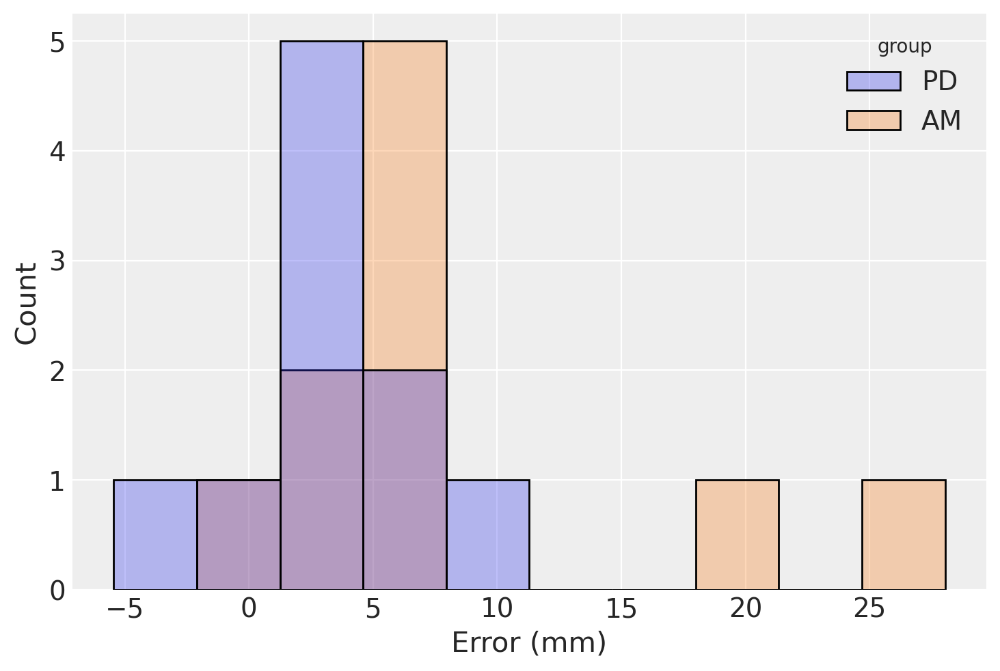

In [7]:
# Plot histogram of errors
fig, ax = plt.subplots()
sns.histplot(data=df_near, x="dist_const_err", hue="group", alpha=0.3)
ax.set_xlabel("Error (mm)");

### Running a t-test with `scipy`

In [8]:
# Run a classical t-test using scipy
stats.ttest_ind(
    df_near.loc[df_near["group"] == "PD", "dist_const_err"], 
    df_near.loc[df_near["group"] == "AM", "dist_const_err"]
)

Ttest_indResult(statistic=-1.8219662553379525, pvalue=0.08511973331219987)

## What does this result tell us? 

From a frequentist perspective, this means that, under the $H_0: \epsilon_{PD} = \epsilon_{AM}$, there is an 8.5% probability of observing a difference of this magnitude or larger due to chance alone. Normally, the $\alpha$ level is set at 0.05, which means that our p-value here of 0.085 is "not signficant" (i.e., there is not enough evidence to reject $H_0$). 

## How can we answer our question with Bayesian statistics? 

***Note: Following section contains code and text adapted from [PyMC developers' example notebook](https://www.pymc.io/projects/examples/en/latest/case_studies/BEST.html), which is a Python port of John Kruschke's well-known paper on [Bayesian Estimation](https://jkkweb.sitehost.iu.edu/articles/Kruschke2013JEPG.pdf).***

- Basic idea is that we want to go beyond binary decisions ("significant" vs "not significant") to estimating parameters and quantifying uncertainty 
- First step in a Bayesian approach to inference is to ***specify the full probability (i.e., generative or graphical) model*** that corresponds to the problem

<center><img src="https://raw.githubusercontent.com/hyosubkim/pymcon-data/main/images/comparison_two_groups.png" width=400></center>
<center><figcaption><i>Fig 16.11 from Doing Bayesian Data Analysis (2nd ed.). Krushcke-style graphical model depicting distributions.</i></figcaption></center> 

- Best to start from bottom, where we have the likelihood function
- Choosing Student t-distribution to describe the distributions of errors in each group
     - More robust - t-distribution is less sensitive to outlier observations compared to normal distribution
- Three parameters for t-distribution: mean $\mu$, precision (inverse-variance) $\lambda$, and degrees-of-freedom $\nu$:

$$f(x|\mu,\lambda,\nu) = \frac{\Gamma(\frac{\nu + 1}{2})}{\Gamma(\frac{\nu}{2})} \left(\frac{\lambda}{\pi\nu}\right)^{\frac{1}{2}} \left[1+\frac{\lambda(x-\mu)^2}{\nu}\right]^{-\frac{\nu+1}{2}}$$
           
- $\nu$ essentially specifies the "normality" of the data with larger values of $\nu$ making the distribution more normal
- Our model specifies two likelihoods, indexed by group:

$$y^{(PD)}_i \sim T(\nu, \mu_1, \sigma_1)$$

$$y^{(AM)}_i \sim T(\nu, \mu_2, \sigma_2)$$

- Both groups share degree of normality $\nu$ 
- Separate parameters for the means $\mu_k, k=1,2$ and standard deviations $\sigma_k$
- Apply normal priors on group means and arbitrarily set the hyperparameters to the pooled empirical mean of the data and twice the pooled empirical standard deviation &rarr; very diffuse priors that do not bias estimates *a priori*

$$\mu_k \sim N(\bar{x}, 2s)$$

### Creating model from scratch with *raw* PyMC code

In [9]:
# Set priors for group means
mu_m = df_near.dist_const_err.mean()
mu_s = df_near.dist_const_err.std() * 2

with pm.Model() as model:
    group1_mean = pm.Normal("group1_mean", mu=mu_m, sigma=mu_s)
    group2_mean = pm.Normal("group2_mean", mu=mu_m, sigma=mu_s)

- The group SDs will be given a uniform prior over a plausible range of values - $\text{Uniform}(0.1, 10)$ - for the variability of the outcome variable, movement error   

In [10]:
# Set priors on group SDs
sigma_low = 10**-1
sigma_high = 10

with model:
    group1_std = pm.Uniform("group1_std", lower=sigma_low, upper=sigma_high)
    group2_std = pm.Uniform("group2_std", lower=sigma_low, upper=sigma_high)

- We follow Kruschke by making the prior for $\nu$ exponentially distributed with a mean of 30
- Allocates high prior probability over the regions of the parameter that describe the range from normal to heavy-tailed data under the t-distribution

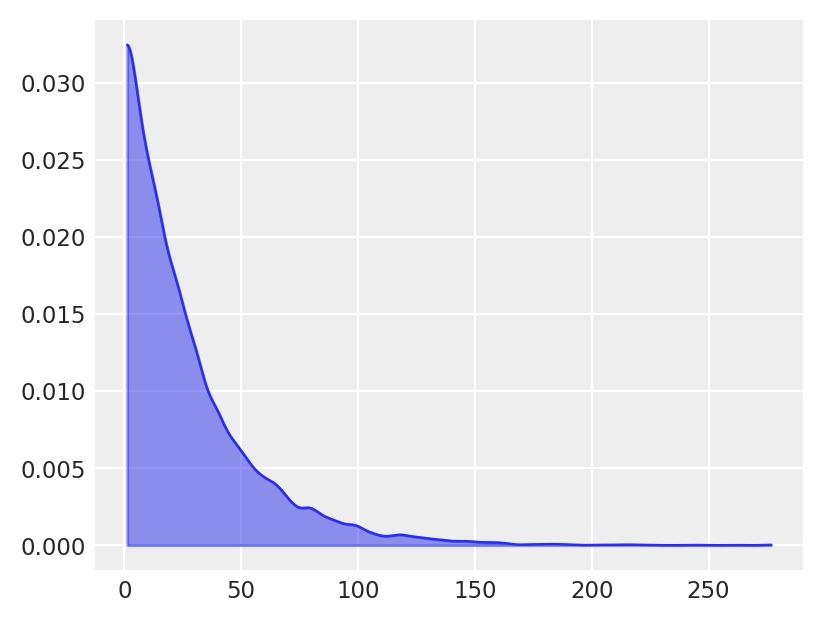

In [11]:
with model:
    nu_minus_one = pm.Exponential("nu_minus_one", 1 / 29.0)
    nu = pm.Deterministic("nu", nu_minus_one + 1)
    nu_log10 = pm.Deterministic("nu_log10", np.log10(nu))

az.plot_kde(rng.exponential(scale=29, size=10000) + 1, fill_kwargs={"alpha": 0.5}, figsize=(4, 3));

- Transform the standard deviations to precisions ($1/\sigma^2$) before specifying our likelihoods.

In [12]:
with model:
    lambda_1 = group1_std**-2
    lambda_2 = group2_std**-2
    group1 = pm.StudentT("PD", nu=nu, mu=group1_mean, lam=lambda_1, observed=df_near.loc[df_near["group"] == "PD", "dist_const_err"])
    group2 = pm.StudentT("AM", nu=nu, mu=group2_mean, lam=lambda_2, observed=df_near.loc[df_near["group"] == "AM", "dist_const_err"])

- Extend `model` definition by computing comparisons (contrasts) of interest, including standardized effect size, in order to evaluate the effect of Parkinson's disease on movement control
- We're simply drawing samples from the posterior and performing determinstic calculations with them

In [13]:
with model:
    diff_of_means = pm.Deterministic("difference of means", group1_mean - group2_mean)
    diff_of_stds = pm.Deterministic("difference of stds", group1_std - group2_std)
    effect_size = pm.Deterministic(
        "effect size", diff_of_means / np.sqrt((group1_std**2 + group2_std**2) / 2)
    )

Now, we can fit the model and evaluate its output.

In [14]:
# Fit the model and get posterior estimates
with model:
    idata = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [group1_mean, group2_mean, group1_std, group2_std, nu_minus_one]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 20 seconds.


- Up to this point, we've done everything besides evaluate the model output
- ***Now, we show how to use BST to perform previous steps and all remaining steps***

## Running the BEST test using the BST

The issues:
- Having to code up model like this from scratch (or copy and pasting) each time you want to run comparison of two groups can be cumbersome
- This type of friction increases probability of falling back on what you already know and are comfortable with (for most, this means running a t-test)

The solution: 
- BST wraps the model in a function to so you get convenience *and* flexibility in model specification (will show you in next example)
- You merely have to call the appropriate function (in this case, BEST, as a tribute to the original authors). 
- Note that BST tries to enforce the use of [tidy data](https://vita.had.co.nz/papers/tidy-data.pdf) by requiring the two inputs to be the outcome variable and the grouping variable, rather than entering separate variables for the two groups' outcomes (e.g., y1 and y2)
- Also, you can increase the number of draws by setting the "n_draws" argument to whatever value you wish. It defaults to 1000 draws per chain
- ***BST always returns what you need to visualize and diagnose your model - `InferenceData` and `Model` objects***

In [15]:
# Fit your Bayesian model with BST
model_bst, idata_bst = BEST(df_near.dist_const_err, df_near.group, n_draws=2000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [group_mean, group_std, nu_minus_one]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 22 seconds.


## What to do after fitting your model

### Check the health of your chains

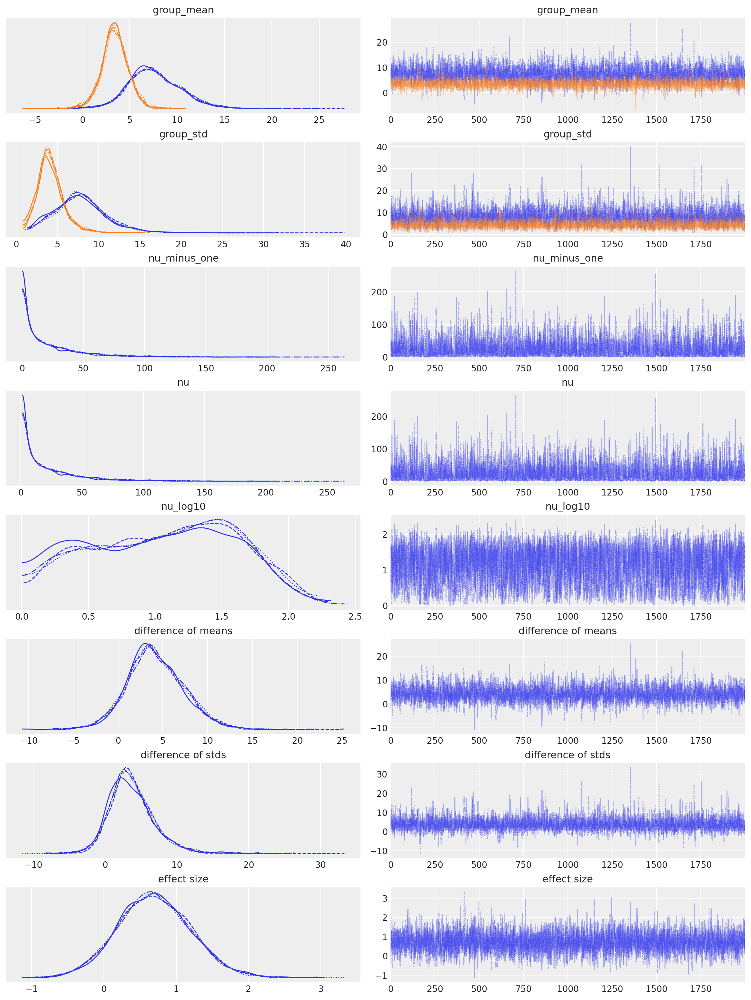

In [16]:
# MCMC diagnosis
az.plot_trace(idata_bst);

- We see qualitatively signs that our sampling worked out well
    - In left panel, we see overlap in posteriors from separate chains
    - In right panel, we see that sampling was more-or-less stationary (i.e., no sudden shifts or drifts across samples)
    - "Hairy caterpillars"
    - For much much more on how to diagnose your MCMC-sampled traces, read [Kruschke](https://sites.google.com/site/doingbayesiandataanalysis/home?authuser=0) and/or [McElreath](https://xcelab.net/rm/statistical-rethinking/) texts

## Plot marginal posteriors

- Arviz's `plot_posterior` function replicates the  histograms portrayed in John Kruschke's textbook
- These summarize the posterior distributions of the parameters and present a 95% credible interval and the posterior mean


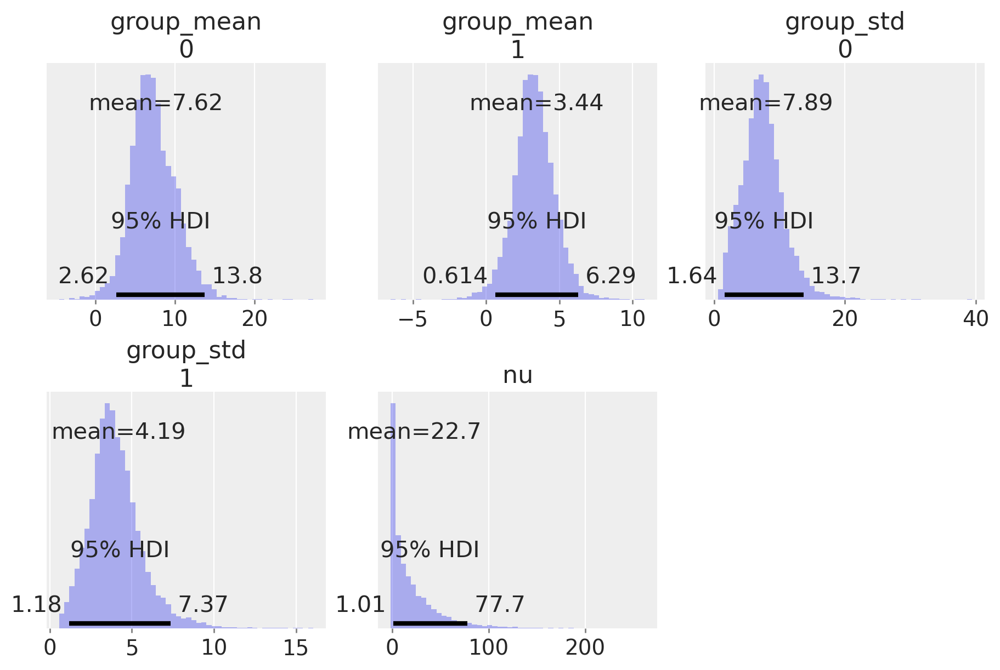

In [17]:
# Plot marginal posterior distributions
az.plot_posterior(
    idata_bst,
    var_names=["group_mean", "group_std", "nu"],
    kind="hist",
    round_to=3,
    bins=50,
    figsize=(9, 6)
);

### Plot posterior contrasts of interest

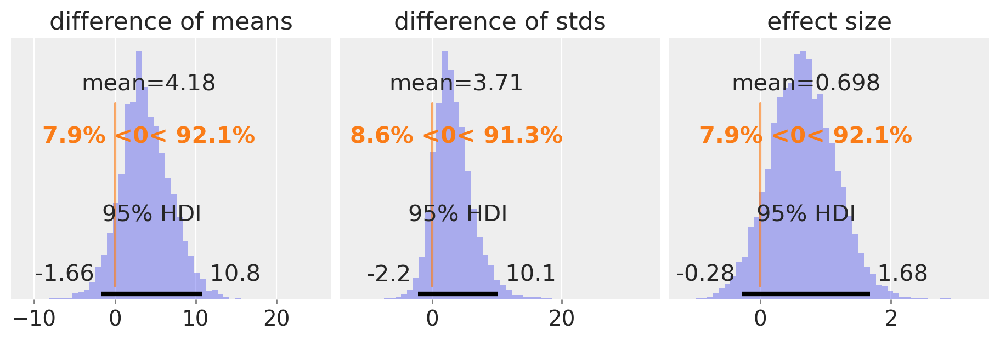

In [18]:
az.plot_posterior(
    idata_bst,
    var_names=["difference of means", "difference of stds", "effect size"],
    ref_val=0,
    kind="hist",
    round_to=3,
    bins=50,
    figsize=(9, 3)
);

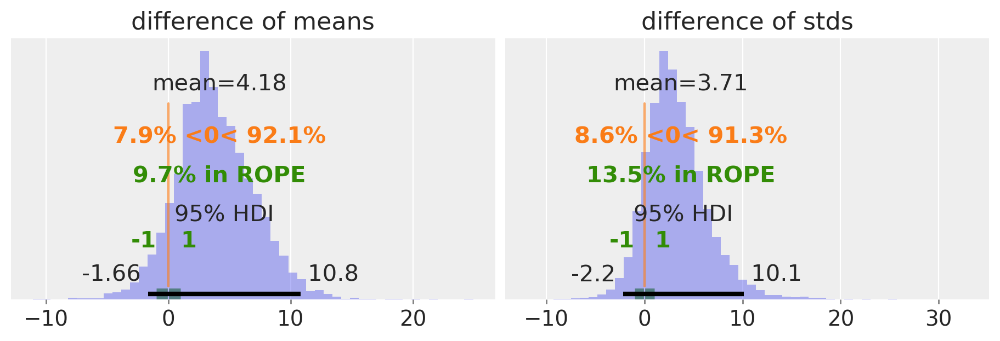

In [19]:
# Quantify evidence in favor of the null 
az.plot_posterior(
    idata_bst,
    var_names=["difference of means", "difference of stds"],
    ref_val=0,
    kind="hist",
    round_to=3,
    bins=50,
    rope=(-1, 1),
    figsize=(9, 3)
);

### Interim conclusions from BST analysis 

- Looks like differences between the two groups for all three measures but they are not very robust
- Using zero as a reference value (`ref_val`), we can see cumulative probabilities for the posterior distribution on either side of the value (e.g., 92% of cumulative probability for difference between group means is above zero)
- The effect size and differences in standard deviation are similarly positive
- Age-matched controls tended to make larger errors than PD subjects for near targets
- Interesting result that will get fleshed out by the end 


### What did we learn from Example 1?

- Based on the probablity model we specify, Bayesian parameter estimation can provide much more information than a t-test 
- Quantifies uncertainty around all parameter estimates
- BST provides convenience functions intended for repeated use
- With BST, with 3 lines of code we were able to: 
    - Fit our model to data
    - Diagnose our model fit
    - Visualize posterior
    
---

## Example 2: Repeated measures design<a class="anchor" id="example2"></a>

- In the previous example, for each participant I pooled all of the data for reaches to targets of the same distance &rarr; essentially treating all 8 targets as a single target to improve estimates of individual subject behavior
- However, one could argue that such pooling of data is only justified if you can show there is no credible effect of target location
- Here, we will run this control analysis
- To simplify things further, we'll only focus on data from the PD group (we'll get to including all the data in the next example)

### Model:
- We are dealing with a situation in which each participant undergoes several different *conditions* (i.e., repeated measures design) 
- We want to model the effect of target location, the *within-subjects* factor, on the same dependent variable as Example 1 - movement error

### Goals: 
- Compare errors in movement extent between all 8 target positions for near target set for PD only 
- Compare frequentist analysis to Bayesian statistical model
- Show how to do this using BST
- Show how BST can serve as helpful starting point for further data exploration
- Show example of posterior predictive check


### Analyze data using frequentist (`statsmodels`) one-liner

In [20]:
# RM ANOVA using SciPy
from statsmodels.stats.anova import AnovaRM

print(AnovaRM(data=df_pd, depvar='dist_const_err', 
              subject='subj_num', within=['tgt_num']).fit())

                Anova
        F Value Num DF  Den DF Pr > F
-------------------------------------
tgt_num  1.0303 7.0000 63.0000 0.4192



### What does this analysis tell us?

- With a p-value of 0.42, this suggests there is not enough evidence to reject $H_0: \beta_i = 0$ 
- That is, no strong evidence that errors were dependent on target angle 

### How can we estimate effect of within-subjects factor with BST?

#### Specify our probability model

$$y \sim N(\mu, \sigma)\hspace{10mm}\text{(likelihood)}$$
$$\mu = \beta_0 + \vec\beta_W \vec{x_W} + \vec\beta_S\vec{x_S}\hspace{4mm}\text{(deterministic)}$$
$$\sigma \sim U(l, u)\hspace{12mm}\text{(prior)}$$
$$\beta_0 \sim N(0, \sigma_0)\hspace{10mm}\text{(prior)}$$
$$\beta_W \sim N(0, \sigma_W)\hspace{10mm}\text{(prior)}$$
$$\sigma_W \sim \text{Gamma}(\alpha, \beta)\hspace{6mm}\text{(hyper-prior)}$$
$$\beta_S \sim N(0, \sigma_S)\hspace{10mm}\text{(prior)}$$
$$\sigma_S \sim \text{Gamma}(\alpha, \beta)\hspace{6mm}\text{(hyper-prior)}$$

- Using a normal likelihood for this problem
- We're modeling the expected value $\mu$ as a linear combination of a baseline deflection from zero $\beta_0$, a within-subjects factor $\vec{x_W}$, and a subject-specific deflection $\vec{x_S}$
- Notice that there are priors for $\sigma_W$ and $\sigma_S$ (i.e., priors on our priors)
- These hyperparameters indicate sharing of information across different levels of the model
- We assume in this model that knowing about effects of one target, or subject, should improve estimate of others
- This type of hierarchical (or multi-level) modeling is an excellent way to extract as much information as you can from your data 
    - PyMC developers have a host of [great resources](https://www.pymc.io/projects/examples/en/latest/gallery.html) on this topic
- Again, we are using diffuse, uninformative priors


In [21]:
# Unpacking variables for convenience
x1 = df_pd["tgt_num"]
x_s = df_pd["subj_num"]
y = df_pd["dist_const_err"]

# Step 1: Fit your Bayesian model and return samples from posterior
model_tgt, idata_tgt = bayesian_oneway_rm_anova(x1, x_s, y, tune=5000, n_draws=3000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a0_tilde, sigma_a1, a1_tilde, sigma_a_s, a_s_tilde, sigma]


Sampling 4 chains for 1_000 tune and 3_000 draw iterations (4_000 + 12_000 draws total) took 45 seconds.


- We want to apply a sum-to-zero constraint on coefficients in ANOVA-like models
- Somewhat clunky to achieve all of this in one function, so BST breaks it up into two steps

In [22]:
# Step 2: Convert to sum-to-zero deflections (see:
# https://stats.stackexchange.com/questions/257778/sum-to-zero-constraint-in-one-way-anova
# for explanation on why)
post_tgt = oneway_rm_anova_convert_to_sum_to_zero(idata_tgt, x1, x_s)


/var/folders/42/fy648srd41l966jbjlswhljc0000gn/T/ipykernel_76172/3382151042.py:221: FutureWarning: extract_dataset has been deprecated, please use extract
  post = az.extract_dataset(idata.posterior)


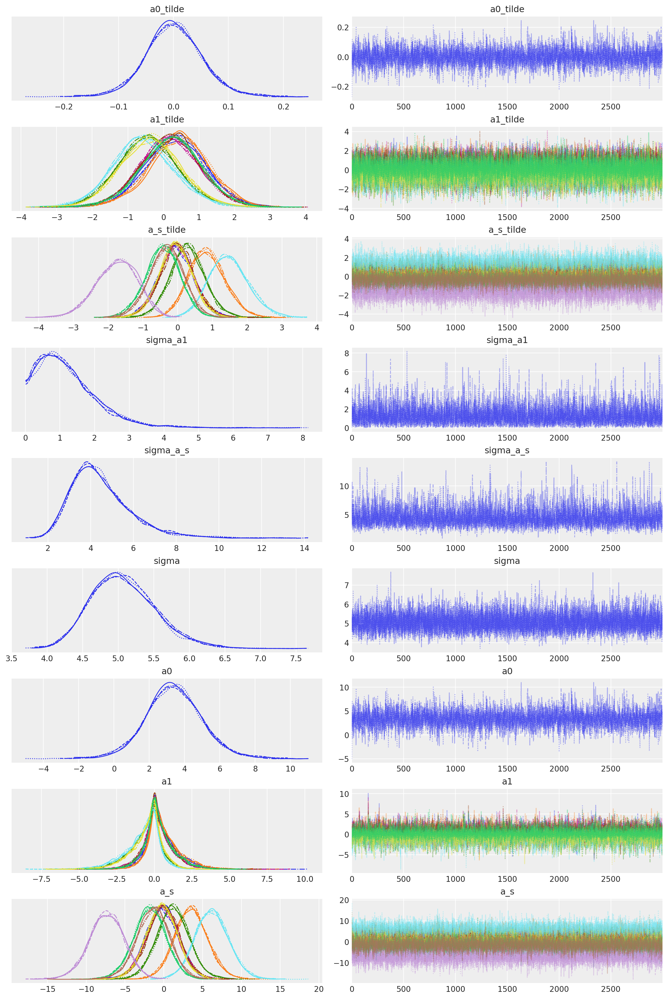

In [23]:
# Diagnose your traces
az.plot_trace(idata_tgt);

### Plot the posterior

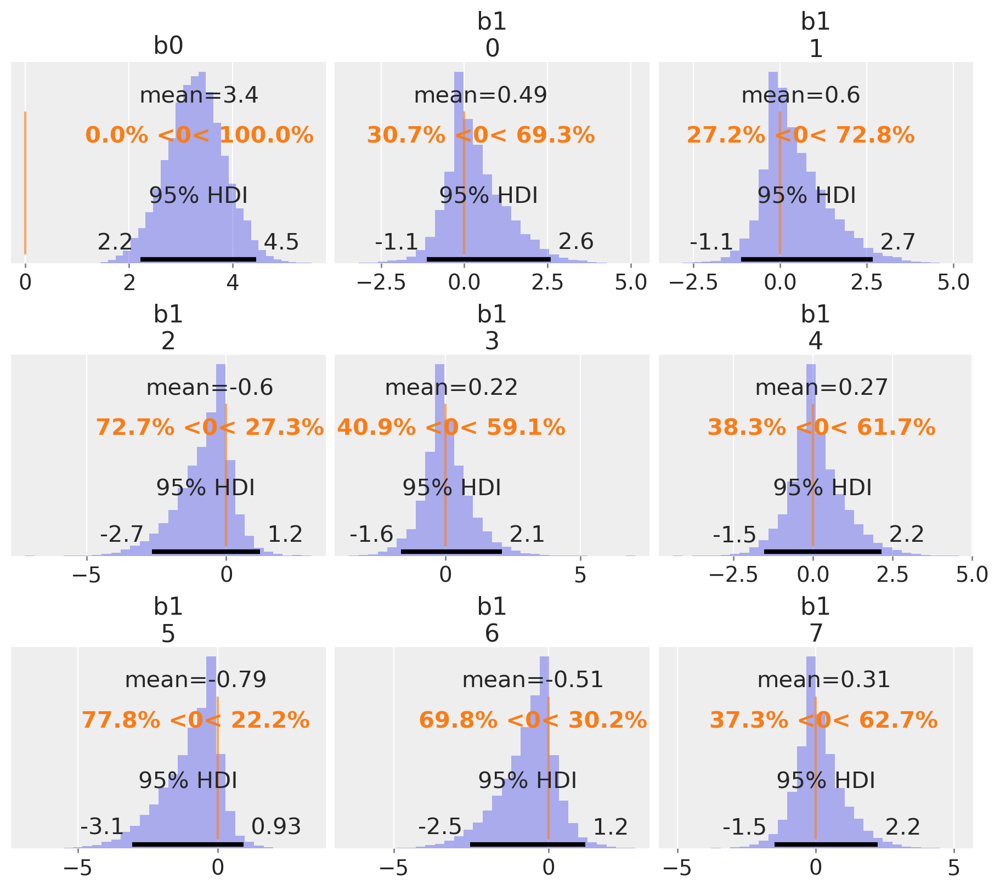

In [24]:
az.plot_posterior(
    post_tgt, 
    var_names=["b0", "b1"], 
    combine_dims={"sample"},
    grid=(3, 3),
    figsize=(9, 8),
    kind="hist", 
    bins=30, 
    ref_val=0);


### Posterior predictive check

- How well does our model retrodict the observed data?
- An important question, and one which we attempt to answer below

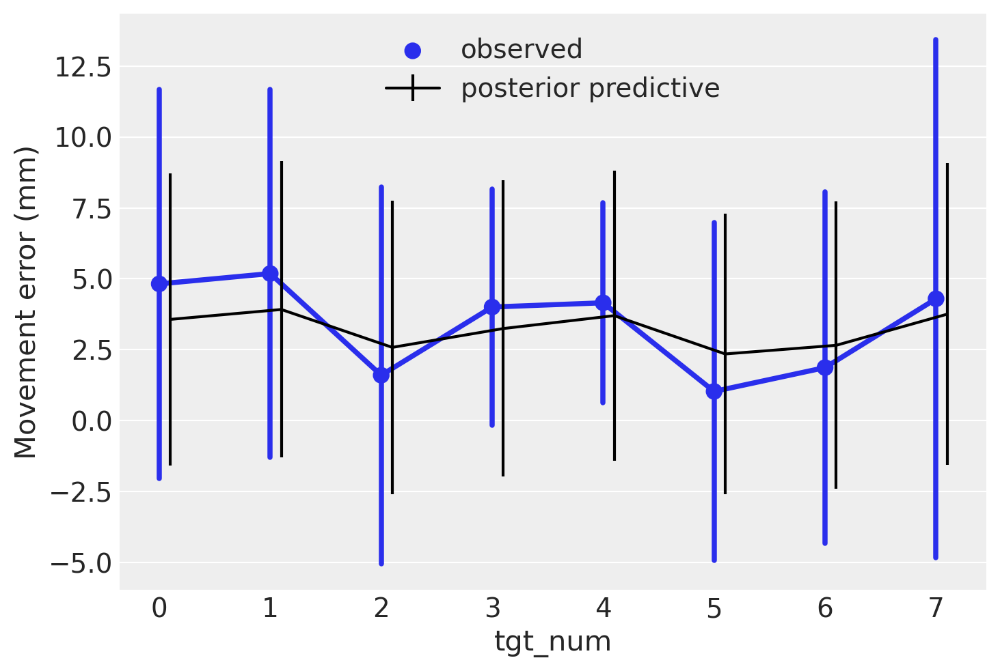

In [25]:
# Plot posterior-predictive
# First, plot observed data
fig, ax = plt.subplots()
sns.pointplot(data=df_pd, x="tgt_num", y="dist_const_err", errorbar="sd", label="observed");

# Second, generate "by hand" n_samp samples from posterior and plot
n_samp = 1000
idxs = np.random.randint(low=0, high=post_tgt.sizes["sample"], size=n_samp)
mu_est = np.zeros((n_samp, 8))
sigma_est = np.zeros((n_samp))
data_pred = np.zeros((n_samp, 8))
for i in range(8):
    mu_est[:, i] = post_tgt.b0[idxs] + post_tgt.b1.sel(factor1=i)[idxs]
    data_pred[:, i] = np.random.normal(loc=mu_est[:, i], scale=post_tgt.sigma[idxs])
ax.errorbar(np.arange(0, 8) + 0.1, data_pred.mean(axis=0), yerr=data_pred.std(axis=0), c='k', label="posterior predictive")
ax.set_ylabel("Movement error (mm)")
ax.legend();

### Not bad, but could potentially be better? 

- We can see that the expected values for each target vary less than the actual observed data
- Due to sharing of information across levels - hyperparameters for $\sigma_{W}$ and prior for $\sigma_{W}$ inform each other
- In other words, assumption is that data at different targets should inform parameter estimates
- Regularizes the parameter estimates, limiting variance in estimates - a phenomenon referred to as "shrinkage"
- We can redefine hyperparameter to allow for greater flexibility 


### Example of how to adjust your BST model to make it fit for purpose

- Shrinkage is not necessarily a bad thing 
- However, if we have a principled reason for believing the within-subjects deflections should not share information across levels, we can easily modify our model

In [26]:
# Copy BST code and show where to edit
bayesian_oneway_rm_anova??

Signature: bayesian_oneway_rm_anova(x1, x_s, y, tune=2000, n_draws=1000)
Source:   
def bayesian_oneway_rm_anova(x1, x_s, y, tune=2000, n_draws=1000):
    """Bayesian analogue of RM ANOVA.
    
    Models instance of outcome resulting from two categorical predictors,
    x1 and x_s (subject identifier). This model assumes each subject 
    contributes only one value to each cell. Therefore, there is no
    modeling of an interaction effect (see Kruschke Ch. 20.5).
    
    Args:
        x1: First categorical predictor variable.
        x_s: Second categorical predictor variable - subject.
        y: The outcome variable.
    
    Returns:
        PyMC Model and InferenceData objects.
    """
    mu_y = y.mean()
    sigma_y = y.std()

    a_shape, a_rate = gamma_shape_rate_from_mode_sd(sigma_y / 2 , 2 * sigma_y)
    x1_vals, levels1, n_levels1 = parse_categorical(x1)
    x_s_vals, levels_s, n_levels_s = parse_categorical(x_s)

    with pm.Model(coords={"factor1": levels1, "factor_subj":

In [27]:
def bayesian_oneway_rm_anova(x1, x_s, y, tune=2000, n_draws=1000):
    """Bayesian analogue of RM ANOVA.
    
    Models instance of outcome resulting from two categorical predictors,
    x1 and x_s (subject identifier). This model assumes each subject 
    contributes only one value to each cell. Therefore, there is no
    modeling of an interaction effect (see Kruschke Ch. 20.5).
    
    Args:
        x1: First categorical predictor variable.
        x_s: Second categorical predictor variable - subject.
        y: The outcome variable.
    
    Returns:
        PyMC Model and InferenceData objects.
    """
    mu_y = y.mean()
    sigma_y = y.std()

    a_shape, a_rate = gamma_shape_rate_from_mode_sd(sigma_y / 2 , 2 * sigma_y)
    x1_vals, levels1, n_levels1 = parse_categorical(x1)
    x_s_vals, levels_s, n_levels_s = parse_categorical(x_s)

    with pm.Model(coords={"factor1": levels1, "factor_subj": levels_s}) as model:
        # To understand the reparameterization, see:
        # http://twiecki.github.io/blog/2017/02/08/bayesian-hierchical-non-centered/ 
        a0_tilde = pm.Normal('a0_tilde', mu=0, sigma=1)
        a0 = pm.Deterministic('a0', mu_y + sigma_y * 5 * a0_tilde)

        # sigma_a1 = pm.Gamma('sigma_a1', a_shape, a_rate)
        sigma_a1 = 5
        a1_tilde = pm.Normal('a1_tilde', mu=0, sigma=1, dims="factor1")
        a1 = pm.Deterministic('a1', 0.0 + sigma_a1*a1_tilde)

        sigma_a_s = pm.Gamma('sigma_a_s', a_shape, a_rate)
        a_s_tilde = pm.Normal('a_s_tilde', mu=0, sigma=1, dims="factor_subj")
        a_s = pm.Deterministic('a_s', 0.0 + sigma_a_s * a_s_tilde)

        mu = a0 + a1[x1_vals] + a_s[x_s_vals] 
        sigma = pm.Uniform('sigma', sigma_y / 100, sigma_y * 10)
        
        # Define the likelihood function
        likelihood = pm.Normal('likelihood', mu, sigma=sigma, observed=y) 
        
        # Sample from the posterior
        idata = pm.sample(draws=n_draws, target_accept=0.95)
        
        return model, idata

In [28]:
# Fit new model
model_tgt2, idata_tgt2 = bayesian_oneway_rm_anova(x1, x_s, y, tune=5000, n_draws=3000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a0_tilde, a1_tilde, sigma_a_s, a_s_tilde, sigma]


Sampling 4 chains for 1_000 tune and 3_000 draw iterations (4_000 + 12_000 draws total) took 43 seconds.


In [29]:
post_tgt2 = oneway_rm_anova_convert_to_sum_to_zero(idata_tgt2, x1, x_s)

/var/folders/42/fy648srd41l966jbjlswhljc0000gn/T/ipykernel_76172/3382151042.py:221: FutureWarning: extract_dataset has been deprecated, please use extract
  post = az.extract_dataset(idata.posterior)


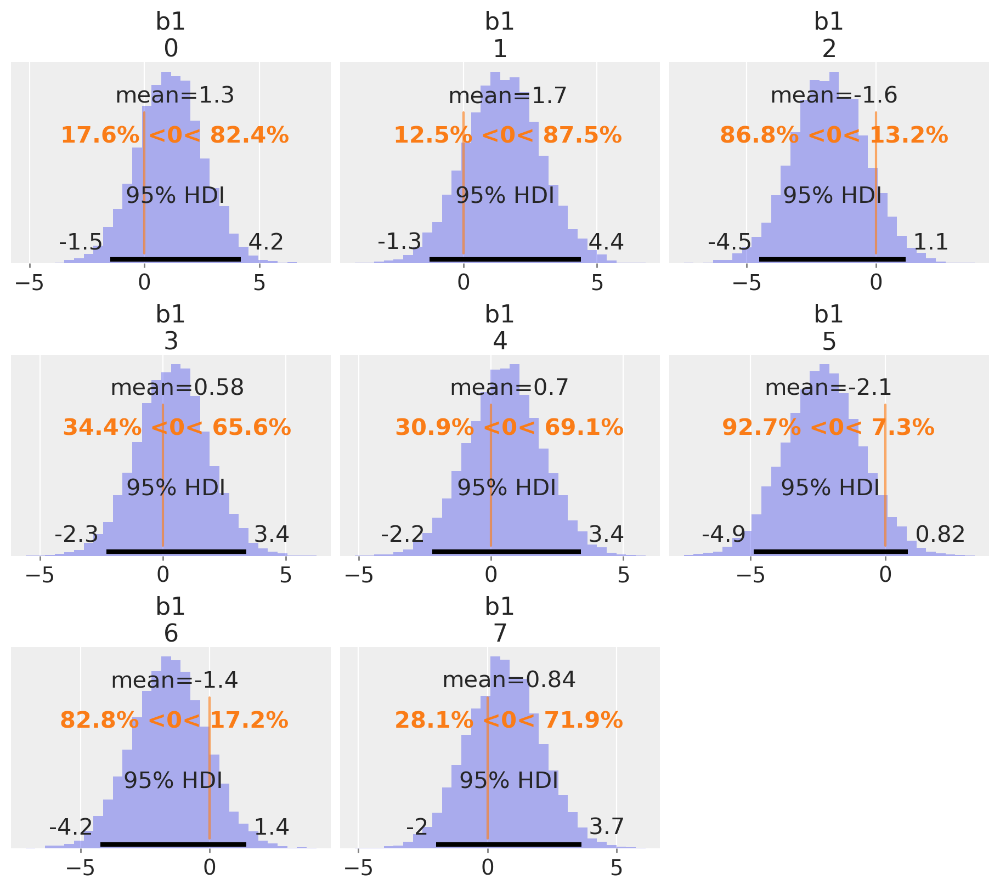

In [30]:
az.plot_posterior(
    post_tgt2, 
    var_names=["b1"], 
    combine_dims={"sample"},
    grid=(3, 3),
    figsize=(9, 8),
    kind="hist", 
    bins=30, 
    ref_val=0);

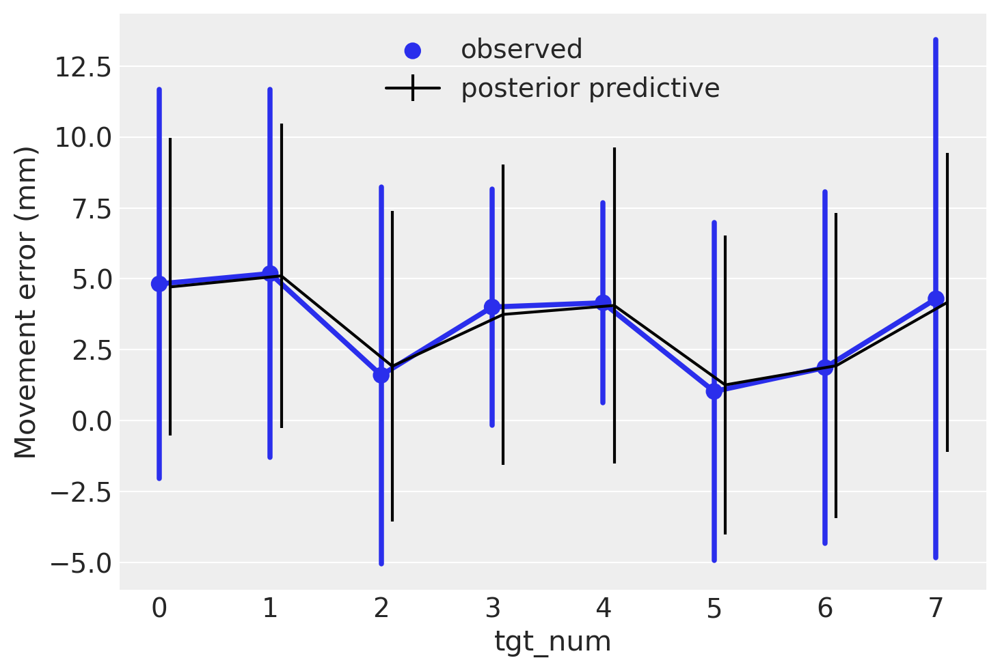

In [31]:
# Plot posterior-predictive
# First, plot observed data
fig, ax = plt.subplots()
sns.pointplot(data=df_pd, x="tgt_num", y="dist_const_err", errorbar="sd", label="observed");

# Second, generate "by hand" n_samp samples from posterior and plot
n_samp = 1000
idxs = np.random.randint(low=0, high=post_tgt2.sizes["sample"], size=n_samp)
mu_est = np.zeros((n_samp, 8))
sigma_est = np.zeros((n_samp))
data_pred = np.zeros((n_samp, 8))
for i in range(8):
    mu_est[:, i] = post_tgt2.b0[idxs] + post_tgt2.b1.sel(factor1=i)[idxs]
    data_pred[:, i] = np.random.normal(loc=mu_est[:, i], scale=post_tgt2.sigma[idxs])
ax.errorbar(np.arange(0, 8) + 0.1, data_pred.mean(axis=0), yerr=data_pred.std(axis=0), c='k', label="posterior predictive")
ax.set_ylabel("Movement error (mm)")
ax.legend();

### Interim conclusions from Example 2

- Again, we see how Bayesian statistics provides much more information than frequentist analogue
- We conclude that there is no credible effect of target at any of the eight target locations
- BST provides a reasonable starting point, and provides scaffolding to edit model according to your requirements
- We could extend this example further (e.g., include separate sigmas for each target), but better to model full dataset as in Example 3


### A word about learning Bayesian statistics with the help of BST

- BST is in large part updating [Jordi Warmenhoven's original PyMC3 port](https://github.com/JWarmenhoven/DBDA-python) of the models from John Kruschke's famous textbook [Doing Bayesian Data Analysis](https://jkkweb.sitehost.iu.edu/DoingBayesianDataAnalysis/) to PyMC 4.0 and wrapping them into tidy functions so that they are easily re-usable
- I've also tested BST models on the examples from Krushke textbook
- Reading the Kruschke text while following along with notebooks in BST's `examples` sub-directory may be a good way for Python users to learn Bayesian statistics 
- Note that not all models from the text are yet included in BST

---

## Example 3: Mixed-model design (between-subjects and within-subjects factors) <a class="anchor" id="example3"></a>

We'll now assume we've run all of the control analyses necessary to justify collapsing data across different targets within the same target set (near/far). 

### Goals

In this analysis, we bring everything together in order to:
- Model the effect of group on movement errors
- Model the effect of near vs far targets on movement errors
- Model the interaction effect (i.e., how errors at different target distances depends on group)
- Perform contrasts between groups at near and far targets

### Points of interest with this model:

- Hierarchical structure of the model
    - Once again, we will pool information by having priors on some of our priors (empty brackets in figure below)
- The comparison we made in the first example is nested within this model (will discuss at end)
- This is one of the most common experimental designs in behavioral sciences - there are multiple groups and each participant is tested on multiple conditions

### Probability model
<center><img src="https://raw.githubusercontent.com/hyosubkim/pymcon-data/main/images/fig20_2.png" width=500></center>
<center><figcaption><i>Fig 20.2 from Doing Bayesian Data Analysis. Note that this figure has very similar structure as our actual model but is not exactly the same (missing subject-specific deflection).</i></figcaption></center>

### More about the model

#### Expected value:
$$\mu_{[i,j,k|i]} = \beta_0 + \beta_{B[i]} + \beta_{W[j]} + \beta_{B \times W[i,j]} + \beta_{S|B[k|i]}$$  

$$\text{where: $i$ indexes the between-subjects factor,}$$
$$ j\hspace{2pt} \text{the within-subjects factor, and}$$
$$ k\hspace{2pt} \text{the subject}$$

#### We are modeling outcome (error) as linear combination of:

- Baseline 
- Between-subjects (i.e., group) effect/deflection
- Within-subjects (i.e., target set) effect/deflection
- Interaction effect
- Subject-specific effect 

#### What BST is doing under the hood for you: 
- Parsing categorical variables for proper indexing
- Reparameterizing to help MCMC sampling 
- Basically, keeping everything tidy and removing lots of pain points

### Data we are trying to model

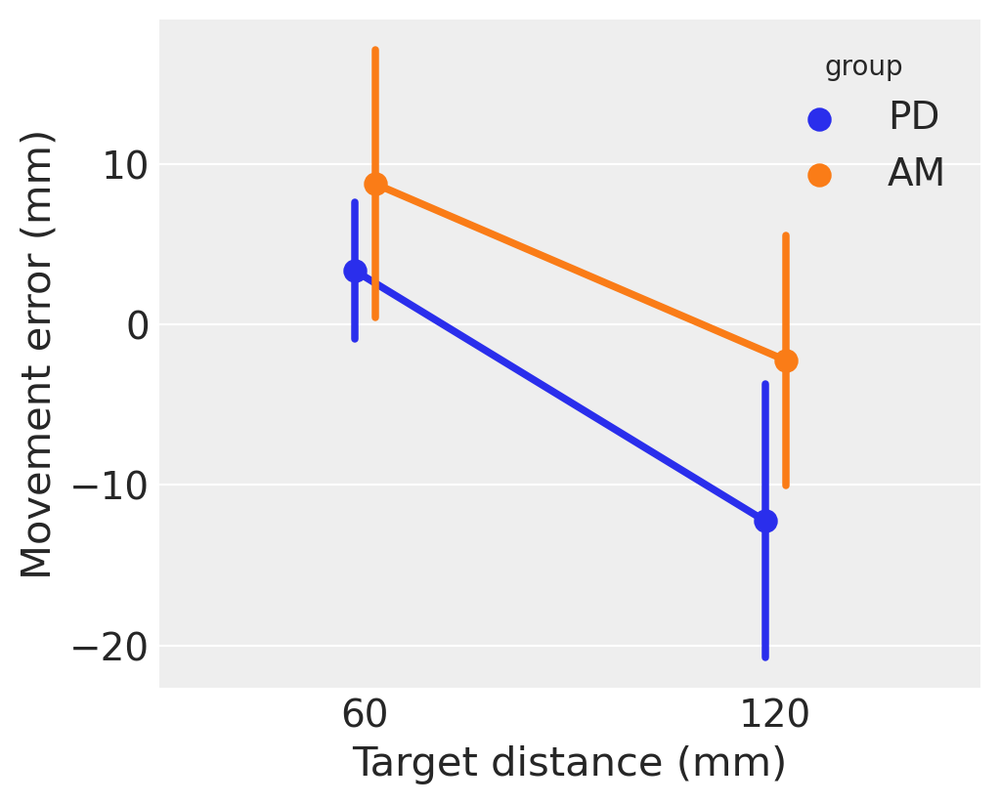

In [32]:
# Plot distance error
fig, ax = plt.subplots(figsize=(5, 4))
sns.pointplot(data=df_set, x="tgt_dist", y="dist_const_err", errorbar="sd", hue="group", dodge=True)
ax.set_xlabel("Target distance (mm)")
ax.set_ylabel("Movement error (mm)");
 

### Fit our Bayesian mixed-model

In [33]:
# Compare errors across groups, target sets
between_subj_var = df_set['group']
within_subj_var = df_set['tgt_dist']
subj_id = df_set['subj_num']
y = df_set['dist_const_err']

# Step 1: Fit your Bayesian model and return samples from posterior
model_mix, idata_mix = bayesian_mixed_model_anova(between_subj_var, within_subj_var, subj_id, y)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [a0, sigma_B, aB, sigma_W, aW, sigma_BxW, aBxW, sigma_S, aS, sigma]


Sampling 4 chains for 2_000 tune and 1_000 draw iterations (8_000 + 4_000 draws total) took 275 seconds.


In [34]:
# Step 2: Convert your parameters to sum-to-zero deflections
post = convert_to_sum_to_zero(idata_mix, between_subj_var, within_subj_var, subj_id)

/var/folders/42/fy648srd41l966jbjlswhljc0000gn/T/ipykernel_76172/3382151042.py:402: FutureWarning: extract_dataset has been deprecated, please use extract
  posterior = az.extract_dataset(idata.posterior)


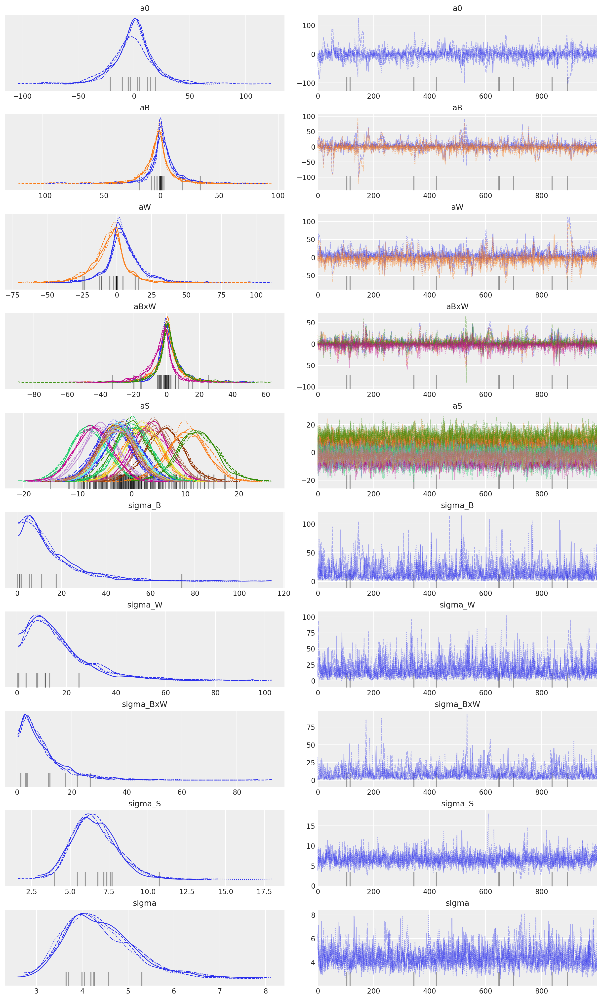

In [35]:
az.plot_trace(idata_mix);

### Performing specific contrasts requires `Xarray` module

Key benefit of `Xarray` is the convenient labeled indexing for multidimensional arrays.

Helpful links:  

- https://docs.xarray.dev/en/stable/getting-started-guide/index.html
- https://cluhmann.github.io/inferencedata/
- https://oriolabrilpla.cat/en/blog/posts/2020/pymc3-arviz.html

***In BST `examples` sub-directory, check out two_way_and_mixed_model_anova.ipynb in conjunction with Kruschke Ch. 20 for more examples.***

### Contrasts of interest:

- Effect of group
- Effect of target set
- Interaction (how does group effect depend on target set?)
- Specific comparisons of PD vs AM at near and far targets
    

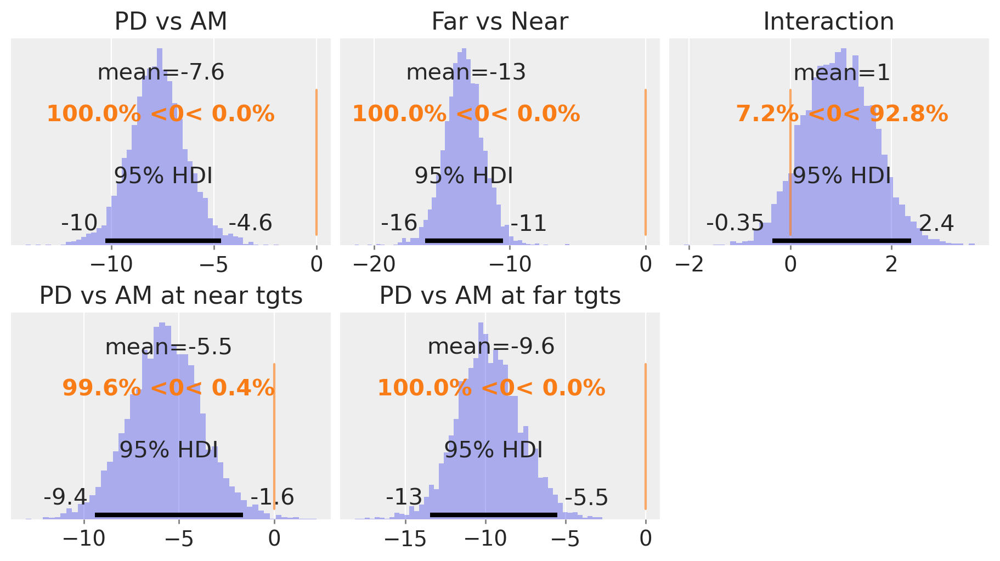

In [36]:
# Contrasts (Note that interaction term is symmetrical, so mainly looking to see
# if density falls to one side or the other of zero)
contrasts = {"PD vs AM": post.bB.sel(between_subj="PD") - post.bB.sel(between_subj="AM"), 
            "Far vs Near": post.bW.sel(within_subj=120) - post.bW.sel(within_subj=60),
             "Interaction": post.bBxW.sel(between_subj="AM", within_subj=120),
            "PD vs AM at near tgts": (post.bB.sel(between_subj="PD") + post.bW.sel(within_subj=60) + 
                                 post.bBxW.sel(between_subj="PD", within_subj=60)) - 
                                 (post.bB.sel(between_subj="AM") + post.bW.sel(within_subj=60) + 
                                  post.bBxW.sel(between_subj="AM", within_subj=60)),
            "PD vs AM at far tgts": (post.bB.sel(between_subj="PD") + post.bW.sel(within_subj=120) + 
                                 post.bBxW.sel(between_subj="PD", within_subj=120)) - 
                                 (post.bB.sel(between_subj="AM") + post.bW.sel(within_subj=120) + 
                                  post.bBxW.sel(between_subj="AM", within_subj=120))}

pm.plot_posterior(contrasts, kind="hist", bins=50, point_estimate="mean", ref_val=0, figsize=(9, 5));

/Users/hyosubkim/opt/anaconda3/envs/bayes_toolbox/lib/python3.11/site-packages/seaborn/axisgrid.py:712: UserWarning: Using the pointplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


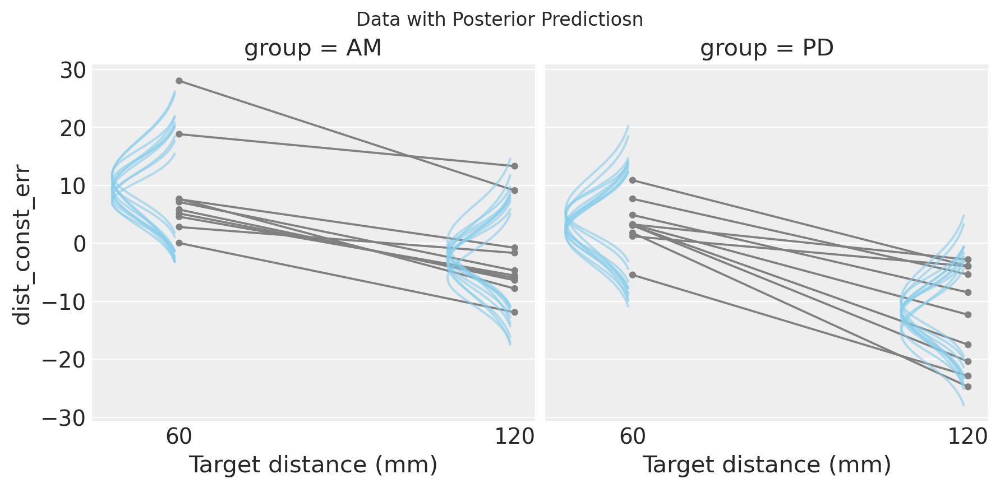

In [37]:
g = sns.FacetGrid(df_set, col='group', hue='subj_num', col_order=["AM", "PD"], height=4, aspect=1.1)
g.map(sns.pointplot, 'tgt_dist', 'dist_const_err', color=[0.5, 0.5, 0.5], scale=0.5)

# Above we found the mean values for the different deflections. Here we plot the
# full posteriors 
for i, j in np.ndindex(2, 2):
    plot_mustache(post.b0+
                  post.bB[i,:]+
                  post.bW[j,:]+
                  post.bBxW[i,j,:],
                  post.sigma,
                  j, width=0.2, ax=g.axes.flatten()[i])

for ax in g.axes.flatten():
    ax.set_xlabel('Target distance (mm)')
    
g.fig.suptitle('Data with Posterior Predictiosn', y=1.05, fontsize=12);

### Conclusions from Example 3

- There are credible differences based on group, target set, and an interaction
- The participants with PD show a strong tendency to reach shorter distances than the age-matched controls, which is especially pronounced at the far targets
- Notice the reduction in uncertainty around the difference between PD vs AM at the near targets compared to BEST test in [Example 1](#example1)
    - Occurs due to pooling data for more accurate estimates
    - Also finer-grained analysis because we include effects of not only group, but subject, target set, and interaction as well
    - Note that I subtracted AM values from PD values here as compared to [Example 1](#example1) in order to highlight the hypometric errors made by the PD group
- BST takes a lot of the pain out of fitting a fairly complex model (at least in terms of *fitting*) 

## Final thoughts and summary

- BST provides you with helpful tools for utilizing and exploring Bayesian statistics in your own research projects right away
- The BST repo provides some notebooks covering examples from Doing Bayesian Data Analysis, so can serve as a useful pedagogical tool as well
- Check out [Bambi](https://bambinos.github.io/bambi/) for more advanced Bayesian modeling interface
- BST is intended to be part of an open and replicable workflow 
- Across these examples, we showed many of the most important steps involved in Bayesian data analysis: 
    - Generative model
    - Fitting model to data
    - Analyzing health of your MCMC chains
    - Posterior predictive checks
    - Visualizing posterior
    - Did not discuss prior predictive checks or model selection
- BST is still in early stages with plans to introduce models and notebooks on:
    - Bayes Factors
    - Bayesian meta-analysis
    - Bayesian spectral analysis
- Please follow the [BST repository](https://github.com/hyosubkim/bayesian-statistics-toolbox) and [follow me on Twitter](https://twitter.com/HyosubEKim) to get updates on upcoming changes/improvements
- Full instructions on installation provided on GitHub
- Plans to add BST to PyPI to make installing BST a breeze
- Join the discussion over at [Discourse](www.cutt.ly/BST-discussion)
- Looking forward to hearing your questions/suggestions!